In [107]:
%load_ext autoreload
%autoreload 2
import ast
import time

# Data Analysis
import pandas as pd
import numpy as np

# Neural Network
import torch 
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader
import torch.nn as nn

# Visualization 
from IPython.display import Image
from wordcloud import WordCloud

# Implemented functions
from helpers import *
from content_based import *
from collaborative import *

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# To be able to see all columns of our dataframes
pd.set_option('display.max_columns', 50)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Table of Contents
1. [Data Overview](#section-1)
    1. [Loading the Data](#section-1.1)
    2. [Missing Values and General Statistics](#section-1.2)
    3. [Augmenting the CMU Dataset](#section-1.3)
    4. [Cleaning the Full Dataset](#section-1.4)
2. [Exploratory Data Analysis](#section-2)
3. [Content-Based Filtering](#section-3)
4. [Collaborative Filtering](#section-4)
    1. [Loading the Ratings Data](#section-4.1)
    2. [Exploratory Data Analysis](#section-4.2)
    3. [Neighborhood-Based Methods](#section-4.3)
        1. [User-Based](#section-4.3.1)
        2. [Item-Based](#section-4.3.1)
    4. [Dimensionality Reduction Methods - SVD](#section-4.4)
    5. [Comparing Collaborative Filtering Models](#section-4.5)  

## 1. Data Overview
<a id='section-1'></a>

### 1.A Loading the Data 
<a id='section-1.1'></a>

We will use different datasets in this project. The first one is from the [CMU Movie Summary Corpus](http://www.cs.cmu.edu/~ark/personas/). Different files are available: some movies metadata, the plot summaries for the same movies and some metadata about the characters presents in them. However, we will only use the movies metadata as we will use another source for the same kind of data of the other two files. Indeed we will use a dataset available on [Kaggle](https://www.kaggle.com/datasets/rounakbanik/the-movies-dataset). This dataset contains movie features from [TMdB](https://www.themoviedb.org/) and the corresponding ratings of many users on these same movies collected on [Movielens](https://grouplens.org/datasets/movielens/). As we will see a bit later, the TMdB dataset will mainly be used to augment and clean the first dataset and the ratings from Movielens will be very useful to build our different recommender systems. We first load the data. 

In [2]:
data_folder = './Data/'
cmu_corpus_path = data_folder + 'Moviesummaries/'
tmdb_path = data_folder + 'TMdB/'

In [3]:
df_cmu_movie = pd.read_csv(cmu_corpus_path + 'movie.metadata.tsv', delimiter='\t', names=['wikipedia_movie_id', 'freebase_movie_id', 
                                                                            'movie_name', 'release_date', 'box_office_revenue',
                                                                            'runtime', 'languages', 'countries', 'genres'], encoding='utf-8')

df_tmdb_movie = pd.read_csv(tmdb_path + 'movies_metadata.csv', low_memory=False)
df_tmdb_credits = pd.read_csv(tmdb_path + 'credits.csv')
df_tmdb_keywords = pd.read_csv(tmdb_path + 'keywords.csv')

Let's inspect the dataframe.

In [4]:
df_cmu_movie.head(2)

,wikipedia_movie_id,freebase_movie_id,movie_name,release_date,box_office_revenue,runtime,languages,countries,genres
0,975900,/m/03vyhn,Ghosts of Mars,2001-08-24,14010832.0,98.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/01jfsb"": ""Thriller"", ""/m/06n90"": ""Science..."
1,3196793,/m/08yl5d,Getting Away with Murder: The JonBenét Ramsey ...,2000-02-16,NaN,95.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/02n4kr"": ""Mystery"", ""/m/03bxz7"": ""Biograp..."


In [5]:
df_tmdb_movie.head(2)

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0


In [6]:
df_tmdb_credits.head(2)

,cast,crew,id
0,"[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",862
1,"[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",8844


In [7]:
df_tmdb_keywords.head(2)

,id,keywords
0,862,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,..."
1,8844,"[{'id': 10090, 'name': 'board game'}, {'id': 1..."


In [8]:
df_cmu_movie.shape, df_tmdb_movie.shape, df_tmdb_credits.shape, df_tmdb_keywords.shape

((81741, 9), (45466, 24), (45476, 3), (46419, 2))

We can see that _df_cmu_movie_ and _df_tmdb_movie_ have indeed some similar features (runtime, language, release date, ...) with _df_tmdb_movie_ having a little more (budget for example). The two other datasets have data about the cast, the crew and some keywords describing the plot of the movies. Comparing the shape of the different datasets, we can directly see that the three datasets from TMdB have almost the same number of movies such that we will merge them, keeping the smallest number of movies of the three, and then we will subset the _df_cmu_movie_ dataset to only keep the movies that are also in the TMdB dataset. 

In [10]:
df_tmdb = merge_tmdb_datasets(df_tmdb_movie, df_tmdb_keywords, df_tmdb_credits)
df_tmdb.shape

(45432, 27)

In [12]:
# We have only lost a few movies merging everything together, that's a good thing ! 
# Let's just check that everything is ok with the new features 
df_tmdb[['adult', 'belongs_to_collection', 'cast', 'crew', 'keywords']].head(2)

,adult,belongs_to_collection,cast,crew,keywords
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...","[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...","[{'id': 931, 'name': 'jealousy'}, {'id': 4290,..."
1,False,NaN,"[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...","[{'id': 10090, 'name': 'board game'}, {'id': 1..."


### 1.B Missing Values and General Statistics
<a id='section-1.2'></a>

We check the proportion of missing values as well as the statistics of the numerical features to have a first look and identify any problems that may already exist.

In [13]:
show_missing_values(df_cmu_movie)

,Missing Count,Missing Proportion
wikipedia_movie_id,0,0.000000
freebase_movie_id,0,0.000000
movie_name,0,0.000000
release_date,6902,0.084437
box_office_revenue,73340,0.897224
runtime,20450,0.250180
languages,0,0.000000
countries,0,0.000000
genres,0,0.000000


In [14]:
show_missing_values(df_tmdb)

,Missing Count,Missing Proportion
adult,0,0.000000
belongs_to_collection,40944,0.901215
budget,0,0.000000
genres,0,0.000000
homepage,37658,0.828887
id,0,0.000000
imdb_id,17,0.000374
original_language,11,0.000242
original_title,0,0.000000
overview,954,0.020998


In [15]:
df_cmu_movie.describe()

,wikipedia_movie_id,box_office_revenue,runtime
count,8.174100e+04,8.401000e+03,6.129100e+04
mean,1.740784e+07,4.799363e+07,1.118192e+02
std,1.098791e+07,1.121753e+08,4.360070e+03
min,3.300000e+02,1.000000e+04,0.000000e+00
25%,7.323695e+06,2.083193e+06,8.100000e+01
50%,1.777899e+07,1.063969e+07,9.300000e+01
75%,2.715573e+07,4.071696e+07,1.060000e+02
max,3.750192e+07,2.782275e+09,1.079281e+06


In [16]:
df_tmdb.describe()

,id,revenue,runtime,vote_average,vote_count
count,45432.000000,4.542900e+04,45172.000000,45429.000000,45429.000000
mean,108368.766750,1.121313e+07,94.126384,5.618453,109.938409
std,112472.571213,6.435282e+07,38.413412,1.923980,491.471473
min,2.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,26459.250000,0.000000e+00,85.000000,5.000000,3.000000
50%,59995.500000,0.000000e+00,95.000000,6.000000,10.000000
75%,157350.250000,0.000000e+00,107.000000,6.800000,34.000000
max,469172.000000,2.787965e+09,1256.000000,10.000000,14075.000000


### 1.C Augmenting the CMU Dataset
<a id='section-1.3'></a>

We now want to merge the CMU and TMdB datasets. However, in the CMU dataset we have two IDs per film, the wikipedia IDs and the freebase IDs. We also have two IDs in the TMdB dataset but this time it is the TMdB IDs and the IMdB IDs, which is unfortunate. We retrieved IMdB IDs from the movies in our original dataset on [wikipedia](https://www.wikipedia.org/). This allows to have a common ID in both datasets to perform the merge more easily.

In [17]:
# This line is commented as the query sometimes crashes (if connection to server fails). We made necessary numbers of query such that the data was 
# obtain once and we saved everything in a csv file to use it more easily.

#wiki_df = wikipedia_query()

In [18]:
wiki_df = pd.read_csv(data_folder + 'wiki.csv')
wiki_df.head(3)

,imdb_id,freebase_ID
0,tt0498329,/m/05c02tm
1,tt1741542,/m/0h_37h3
2,tt1675434,/m/0hgqwpj


In [21]:
wiki_df.shape

(121493, 2)

We have a lot of movies so hopefully we won't loose too many of them when merging both _df_cmu_movie_ and _df_tmdb_ together.

In [45]:
# Put imdb_id into df_cmu_movie by merging on freebase_ID
df_cmu_movie_with_id = pd.merge(df_cmu_movie, wiki_df, left_on='freebase_movie_id', right_on='freebase_ID', how='inner')
df_cmu_movie_with_id.shape

(73367, 11)

In [46]:
df_cmu_movie_with_id[['wikipedia_movie_id', 'freebase_movie_id', 'imdb_id']].head(2)

,wikipedia_movie_id,freebase_movie_id,imdb_id
0,975900,/m/03vyhn,tt0228333
1,3196793,/m/08yl5d,tt0245916


In [47]:
# Everything seems fine so let's merge df_tmdb and df_cmu_movie together
df_final_dataset = pd.merge(df_cmu_movie_with_id, df_tmdb, on ='imdb_id', how='inner', suffixes=['_cmu', '_tmdb'])
df_final_dataset.shape

(27329, 37)

We have indeed loose a lot of movies but still having more than 27'000 movies is more than sufficient to build recommender systems (probably nobody has ever watched this much number of movies). 

### 1.D Cleaning the Full Fataset
<a id='section-1.4'></a>

We now have a lot of new features, but some are duplicates and sometimes we have not the same information depending of the source dataset. We will need to take care of all of these to have a nice complete and clean dataset to work with afterwards.

We start by dropping non useful columns as well as organizing the columns such that duplictates columns are side by side.

In [48]:
# Dropping non-necessary ids : we have wikipedia_movie_id, imdb_id, tmdb ids called id. We will only keep imdb_id to work with reviews later 
# and drop the rest of them. We also drop some non useful columns such as homepage or status. 

df_final_dataset.drop(columns=['poster_path', 'wikipedia_movie_id', 'freebase_movie_id', 'freebase_ID', 'homepage', 'id', 
                               'popularity', 'vote_average', 'vote_count', 'status', 'video'], inplace=True)
df_final_dataset = df_final_dataset[['imdb_id', 'movie_name', 'title', 'original_title', 'box_office_revenue', 'revenue', 'budget',
                                     'release_date_cmu', 'release_date_tmdb', 'runtime_cmu', 'runtime_tmdb', 'genres_cmu', 'genres_tmdb',
                                     'languages', 'original_language', 'spoken_languages', 'countries', 'production_countries', 'production_companies', 
                                     'overview', 'tagline', 'keywords', 'cast', 'crew',
                                     'adult', 'belongs_to_collection']]
df_final_dataset.shape                      

(27329, 26)

We may not use all the features afterwards but, for the time being, we've only removed the ones we were sure we wouldn't use. 

We have the followings duplicates: title/movie_name (and original_title in a sense), box_office_revenue/revenue, release_date_cmu/release_date_tmdb, genres_cmu/genres_tmdb, languages/original_language and countries/production_countries. They are other columns that have similar information such as overview/keywords but we will keep them for now and concentrate our efforts in cleaning the duplicates.

#### _Cleaning title_

We start by checking if the three columns have missing values. Here there are none. We then show the first elements of each of these columns and we can clearly see that the title column has all the titles in english, the original title column has, as expected, the title in the original language. For the movie name we can see a combination of the two in the sense that the chosen language for the title is not consistent. Thus, in this case, we decide to only keep the title column.

In [49]:
show_missing_values(df_final_dataset[['movie_name', 'title', 'original_title']])

,Missing Count,Missing Proportion
movie_name,0,0.0
title,0,0.0
original_title,0,0.0


In [50]:
df_final_dataset[df_final_dataset['original_title'] != df_final_dataset['title']][['title', 'original_title', 'movie_name']].head(5)

,title,original_title,movie_name
16,Rudo & Cursi,Rudo y Cursi,Rudo y Cursi
18,Innocence,Masumiyet,Innocence
21,The Fiances,I fidanzati,I Fidanzati
24,Chasing Ghosts: Beyond the Arcade,Chasing Ghosts,Chasing Ghosts: Beyond the Arcade
30,Twelve Plus One,12 + 1,The Thirteen Chairs


In [51]:
df_final_dataset.drop(columns=['original_title', 'movie_name'], inplace=True)

#### _Cleaning other duplicates_

For the box office, the runtime and the release date we proceed as follows: if there is two NaNs in the two columns we just don't have the information. If the values in the two columns are equal this is perfect. If we have only one value and thus one NaN, we will obviously keep the only value we have. When the values are different we start to check if the difference is of 5% or less for the runtime and the box office. In this case, we keep the value from the CMU dataset. For the release date, we check if the year is the same and in this case we also choose the value from the CMU dataset. For all the remaining different values, we decide to choose the one from the CMU dataset. One could argue that we could just choose the values of the CMU dataset in all case where the values are different, as this is actually what we do. However, we proceed this way such that we have a better comprehension of our data.

In [52]:
df_final_dataset['release_date_cmu'] = pd.to_datetime(df_final_dataset['release_date_cmu'], errors='coerce')
df_final_dataset['release_date_tmdb'] = pd.to_datetime(df_final_dataset['release_date_tmdb'], errors='coerce')
# As we have seen above, the revenue column contains 0 when the value is not known or don't exists so we replace them with NaNs
df_final_dataset['revenue'] = df_final_dataset['revenue'].replace(0, np.nan)

In [53]:
show_missing_values(df_final_dataset[['box_office_revenue', 'revenue']])

,Missing Count,Missing Proportion
box_office_revenue,19768,0.723334
revenue,21429,0.784112


In [54]:
show_missing_values(df_final_dataset[['release_date_cmu', 'release_date_tmdb']])

,Missing Count,Missing Proportion
release_date_cmu,10860,0.397380
release_date_tmdb,7,0.000256


In [55]:
show_missing_values(df_final_dataset[['runtime_cmu', 'runtime_tmdb']])

,Missing Count,Missing Proportion
runtime_cmu,1242,0.045446
runtime_tmdb,22,0.000805


In [56]:
df_final_dataset = clean_duplicates(df_final_dataset)

Cleaning the columns...
All columns cleaned !


In [57]:
show_missing_values(df_final_dataset[['box_office_clean', 'release_date_clean', 'runtime_clean']])

,Missing Count,Missing Proportion
box_office_clean,10825,0.396099
release_date_clean,10863,0.397490
runtime_clean,12891,0.471697


TO DO CHECK THE FUNCTION
We can see that the proportion of missing values for the box office is way lower than before. And not all movies were released at the cinema, so we can not expect to have zero missing count. However, for the release date with have the same proportion and for the runtime it is worse than before. This is a strange behaviour, the function will be checked again soon in order to find any mistakes and/or understand what is happening.

In [58]:
df_final_dataset.drop(columns=['box_office_revenue', 'revenue', 'release_date_cmu', 'release_date_tmdb', 'runtime_cmu', 'runtime_tmdb'], inplace=True)
df_final_dataset.shape

(27329, 21)

We still have some duplicates. However, this is for columns of the CMU dataset that don't have any missing values as shown below, thus we will keep the original column and drop the one from the TMdB dataset. 

In [59]:
show_missing_values(df_final_dataset[['genres_cmu', 'languages', 'countries']])

,Missing Count,Missing Proportion
genres_cmu,0,0.0
languages,0,0.0
countries,0,0.0


In [60]:
df_final_dataset.drop(columns=['genres_tmdb', 'production_countries'], inplace=True)

#### _Cleaning everything else_

We now clean the remaining columns such as extracting the information from the dictionnary in each row or getting the director from the crew.

In [61]:
df_final_dataset['countries'] = df_final_dataset['countries'].apply(extract_from_dict)
df_final_dataset['languages'] = df_final_dataset['languages'].apply(extract_from_dict)
df_final_dataset['genres_cmu'] = df_final_dataset['genres_cmu'].apply(extract_from_dict)
df_final_dataset['spoken_languages'] = df_final_dataset['spoken_languages'].fillna('[]')# Apply literal_eval only to entries that are strings
df_final_dataset['spoken_languages'] = df_final_dataset['spoken_languages'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else np.nan
)

df_final_dataset['cast'] = df_final_dataset['cast'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
df_final_dataset['cast'] = df_final_dataset['cast'].apply(lambda x: [i['name'] for i in x] if isinstance(x, list) and all(isinstance(i, dict) and 'name' in i for i in x) else [])

df_final_dataset['crew'] = df_final_dataset['crew'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

df_final_dataset['keywords'] = df_final_dataset['keywords'].apply(ast.literal_eval)
df_final_dataset['keywords'] = df_final_dataset['keywords'].apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])

df_final_dataset['production_companies'] = df_final_dataset['production_companies'].fillna('[]').apply(ast.literal_eval)
df_final_dataset['production_companies'] = df_final_dataset['production_companies'].apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])

df_final_dataset['director'] = df_final_dataset['crew'].apply(get_director)

In [63]:
df_final_dataset['filtered_cast'], actor_counts_df = remove_actors_one_appearance(df_final_dataset['cast'])

In [67]:
df_final_dataset['filtered_director'], director_counts_df = remove_directors_one_movie(df_final_dataset)

In [69]:
df_final_dataset.drop(columns=['crew'], inplace=True)

In [70]:
df_final_dataset['spoken_languages'] = df_final_dataset['spoken_languages'].apply(lambda x: [d['iso_639_1'] for d in x])

In [71]:
df_final_dataset['year'] = df_final_dataset['release_date_clean'].dt.year
df_final_dataset['month'] = df_final_dataset['release_date_clean'].dt.month
df_final_dataset['day'] = df_final_dataset['release_date_clean'].dt.day

In [72]:
df_final_dataset.drop(columns=['release_date_clean'], inplace=True)

In [73]:
df_final_dataset.to_pickle('Data/df_final_dataset.pickle')

## 2. Exploratory Data Analysis
<a id='section-2'></a>

We now do basic plot to understand a bit more our data. For all the following plots, we do an _html_ and a _png_ version. The _png_ version is used such that the plots can be shown in the Github. The _html_ (that can be interactive but not necessarly) version might be used on the data story. However, since this is mostly simple visualizations to understand our data, we might not use any of them in the data story.

In [112]:
# If we don't want to run all the cleaning of df_final_dataset
# df_final_dataset = pd.read_pickle('Data/df_final_dataset.pickle')

#### World map of the number of movies per country

In [113]:
df_countries = df_final_dataset['countries'].str.split(', ', expand=True).stack().reset_index(level=1, drop=True)
country_counts_df = df_countries.value_counts().reset_index(name='movie_count').rename(columns={'index': 'country'})

# Plot the map
fig = plot_movies_by_country(country_counts_df)

fig.write_image("Visualization/world_map_of_movies_count.png", width=1000, height=600, scale=10)
fig.write_html("Visualization/world_map_of_movies_count.html")

In [ ]:
Image("Visualization/world_map_of_movies_count.png", width=1200, height=800)

#### Histogram of number of movie for a given language 

In [ ]:
df_languages = df_final_dataset['languages'].str.split(', ', expand=True).stack().reset_index(level=1, drop=True)
language_counts_df = df_languages.value_counts().reset_index(name='count').rename(columns={'index': 'language'})
top_languages = language_counts_df.iloc[:10] 

fig = plot_language_count(top_languages)

fig.write_image("Visualization/top_languages_count.png", width=1100, height=600, scale=10)
fig.write_html("Visualization/top_languages_count.html")

In [ ]:
Image("Visualization/top_languages_count.png")

#### Histogram of number of movie per diretor 

In [ ]:
top_directors = director_counts_df.iloc[:20]  
fig = plot_directors_count(top_directors)

# Save the plot
fig.write_image("Visualization/top_directors_count.png", width=1100, height=600, scale=10)
fig.write_html("Visualization/top_directors_count.html")

In [ ]:
Image("Visualization/top_directors_count.png")

#### Histogram of number of movie per actors

In [ ]:
top_actors = actor_counts_df.iloc[:20] 
fig = plot_actors_count(top_actors)

fig.write_image("Visualization/plot_actors_count.png", width=1100, height=600, scale=10)
fig.write_html("Visualization/plot_actors_count.html")

In [ ]:
Image("Visualization/plot_actors_count.png")

#### Histogram of number of movie per year

In [ ]:
year_occurrences = df_final_dataset['year'].value_counts().sort_index()

fig = plot_year_occurences(year_occurrences)

fig.write_image("Visualization/year_occurrences.png", width=1100, height=600, scale=10)
fig.write_html("Visualization/year_occurrences.html")

In [ ]:
Image("Visualization/year_occurrences.png")

#### Histogram of number of movie per month

In [ ]:
month_occurrences = df_final_dataset['month'].value_counts().sort_index()

fig = plot_month_occurences(month_occurrences)

fig.write_image("Visualization/month_occurrences.png", width=1100, height=600, scale=10)
fig.write_html("Visualization/month_occurrences.html")

In [ ]:
Image("Visualization/month_occurrences.png")

#### Histogram of number of movie per day 

In [ ]:
day_occurrences = df_final_dataset['day'].value_counts().sort_index()

fig = plot_day_occurences(day_occurrences)

fig.write_image("Visualization/day_occurrences.png", width=1100, height=600, scale=10)
fig.write_html("Visualization/day_occurrences.html")

In [ ]:
Image("Visualization/day_occurrences.png")

#### Histogram of number of movie per genre

In [ ]:
top_genres = value_counts_for_genre(df_final_dataset['genres_cmu'])

fig = plot_genre_counts(top_genres)

fig.write_image("Visualization/plot_genres_counts.png", width=1100, height=600, scale=10)
fig.write_html("Visualization/plot_genres_counts.html")

In [ ]:
Image("Visualization/plot_genres_counts.png")

#### Wordcloud of keywords

In [ ]:
keywords_frequencies = value_counts_for_keywords(df_final_dataset['keywords'])

wordcloud = WordCloud(
    width=800, 
    height=500, 
    background_color='white',
    colormap='YlGnBu'  # Optional: Set the color palette
).generate_from_frequencies(keywords_frequencies)

wordcloud.to_file("Visualization/wordcloud_keywords.png")

In [ ]:
Image("wordcloud_keywords_high_quality.png")

#### Runtime of movies over time

In [ ]:
# Compute the average runtime by year
runtime_over_time = df_final_dataset.groupby('year')['runtime_clean'].mean().reset_index()

fig = plot_runtime_over_time(runtime_over_time)

fig.write_image("Visualization/plot_runtime_over_time.png", width=1100, height=600, scale=10)
fig.write_html("Visualization/plot_runtime_over_time.html")

In [ ]:
Image("Visualization/plot_runtime_over_time.png")

# TO DO 

In [ ]:
df_corr = df_final_dataset[['day', 'month', 'year', 'box_office_clean', 'runtime_clean', 'budget']]

In [ ]:
df_final_dataset.head(1)

In [ ]:
import plotly.figure_factory as ff
import numpy as np

# Compute the correlation matrix
correlation_matrix = df_corr.corr()

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool), k=1)

# Apply the mask
masked_corr = correlation_matrix.mask(mask)

# Round the numbers to 2 decimal places
rounded_corr = masked_corr.round(2)

# Define a custom color scale
custom_colorscale = [
    [0.0, "blue"],
    [0.5, "white"],
    [1.0, "red"]
]

# Create the heatmap
fig = ff.create_annotated_heatmap(
    z=rounded_corr.values,
    x=rounded_corr.columns.tolist(),
    y=rounded_corr.index.tolist(),
    colorscale=custom_colorscale,
    zmin=-1,
    zmax=1,
    showscale=True,
    annotation_text=rounded_corr.values.astype(str)
)

# Update the layout
fig.update_layout(
    title='Correlation Matrix',
    title_font_size=20,
    template='plotly_white',
    width=800,
    height=600
)

# Show the figure
fig.show()

## 3. Content-Based Filtering
<a id='section-3'></a>

In [97]:
from content_based import *

In [98]:
# df_final_dataset = pd.read_pickle('Data/df_final_dataset.pickle')

In [99]:
df_final_dataset[['title', 'imdb_id']].to_csv('Data/movie_names.csv')

In [100]:
df = df_final_dataset.copy(deep=True)
#all_countries, df = one_hot_encode(df, 'countries', 'country')
all_keywords, df = one_hot_encode(df, 'keywords', 'keyword', 300)
#all_languages, df = one_hot_encode(df, 'languages', 'language')
all_languages, df = one_hot_encode(df, 'original_language', 'origin_lang')
all_genres, df = one_hot_encode(df, 'genres_cmu', 'genre')
df.columns

 The dataframe has 300 different categories of keywords. Let' one hot encode !
 The dataframe has 77 different categories of original_language. Let' one hot encode !
 The dataframe has 100 different categories of genres_cmu. Let' one hot encode !


Index(['imdb_id', 'title', 'budget', 'genres_cmu', 'languages',
       'original_language', 'spoken_languages', 'countries',
       'production_companies', 'overview',
       ...
       'genre_Fantasy Comedy', 'genre_Political thriller', 'genre_Zombie Film',
       'genre_Courtroom Drama', 'genre_Fantasy Adventure',
       'genre_Domestic Comedy', 'genre_Experimental film',
       'genre_Computer Animation', 'genre_Comedy of Errors', 'genre_Erotica'],
      dtype='object', length=500)

In [101]:
df['box_office_normalized'] = np.log(df['box_office_clean'].replace(0, 1))
df['box_office_normalized'] = normalize_without_nan(df, 'box_office_normalized', clip=5)
df['year_normalized'] = normalize_without_nan(df, 'year', 0, clip=5)
df['runtime_normalized'] = normalize_without_nan(df, 'runtime_clean', clip=5)

C:\Users\Corentin\AppData\Local\Temp\ipykernel_31348\1950484742.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\Corentin\AppData\Local\Temp\ipykernel_31348\1950484742.py:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\Corentin\AppData\Local\Temp\ipykernel_31348\1950484742.py:4: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fr

In [103]:
# Create final feature matrix
feature_columns = (
    [f'genre_{genre}' for genre in all_genres] +
    #[f'country_{country}' for country in all_countries] +
    [f'origin_lang_{language}' for language in all_languages] +
    [f'keyword_{keyword}' for keyword in all_keywords] +
    ['runtime_normalized', 'box_office_normalized'] +
    ['year_normalized']
)

# Create feature matrix
X = df[feature_columns]
print(f'Numer of na : {np.isnan(X).sum().sum()}')

# Print some information about the features
print("Feature matrix shape:", X.shape)

df['year'] = df_final_dataset['year']

Numer of na : 0
Feature matrix shape: (27329, 480)


In [105]:
X_tensor = torch.Tensor(X.values)

In [106]:
torch.save(X_tensor, 'Weights/torch_tensor.pt', )

In [108]:
input_dim = X_tensor.shape[1]  # number of features after one-hot encoding
encoding_dim = 500 # this is a hyperparameter you can tune
sae = SparseMovieAutoencoder(input_dim=input_dim, encoding_dim=encoding_dim, sparsity_param= 0.01, beta=0.01)

# Create a simple DataLoader
dataset = TensorDataset(X_tensor)
train_loader = DataLoader(dataset, batch_size=32, shuffle=True)

# Train the model
optimizer = torch.optim.Adam(sae.parameters(), lr=0.001, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, factor=0.5)
reconstruction_criterion = nn.MSELoss()

# Training loop
training_history = {
        'total_loss': [],
        'reconstruction_loss': [],
        'sparsity_loss': [],
        'avg_activation': [],
        'sparsity_ratio': [],
        'encoding_std': []
    }

# Training loop
print("Starting training...")
for epoch in range(50):
    total_loss = 0
    recon_loss = 0
    sparse_loss = 0
    epoch_encodings = []
    
    for batch in train_loader:
        optimizer.zero_grad()
        
        # Forward pass
        encodings, reconstructions = sae(batch[0])
        epoch_encodings.append(encodings.detach())
        
        # Calculate losses
        reconstruction_loss = reconstruction_criterion(reconstructions, batch[0])
        sparsity_loss = sae.get_sparsity_loss(encodings)
        loss = reconstruction_loss + sae.beta * sparsity_loss

        # Inside training loop, before loss.backward()
        if torch.isnan(loss):
            print(f"NaN detected!")
            print(f"Reconstruction loss: {reconstruction_loss.item()}")
            print(f"Sparsity loss: {sparsity_loss.item()}")
            print(f"Encoding stats - min: {encodings.min()}, max: {encodings.max()}, mean: {encodings.mean()}")
        
        # Backward pass
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
        recon_loss += reconstruction_loss.item()
        sparse_loss += sparsity_loss.item()
    
    # Combine all batch encodings
    epoch_encodings = torch.cat(epoch_encodings, dim=0)
    sparsity_ratio, avg_activation, encoding_std = analyze_encodings(epoch_encodings)
    
    # Store metrics
    training_history['total_loss'].append(total_loss / len(train_loader))
    training_history['reconstruction_loss'].append(recon_loss / len(train_loader))
    training_history['sparsity_loss'].append(sparse_loss / len(train_loader))
    training_history['sparsity_ratio'].append(sparsity_ratio)
    training_history['avg_activation'].append(avg_activation)
    training_history['encoding_std'].append(encoding_std)
    
    # Print progress
    print(f"Epoch {epoch}: Loss={total_loss/len(train_loader):.4f}, "
            f"Sparsity Ratio={sparsity_ratio:.4f}, "
            f"Avg Activation={avg_activation:.4f}")

Starting training...
Epoch 0: Loss=0.0690, Sparsity Ratio=0.3056, Avg Activation=0.0215
Epoch 1: Loss=0.0437, Sparsity Ratio=0.4808, Avg Activation=0.0177
Epoch 2: Loss=0.0362, Sparsity Ratio=0.5886, Avg Activation=0.0144
Epoch 3: Loss=0.0301, Sparsity Ratio=0.6492, Avg Activation=0.0123
Epoch 4: Loss=0.0264, Sparsity Ratio=0.6632, Avg Activation=0.0115
Epoch 5: Loss=0.0248, Sparsity Ratio=0.6616, Avg Activation=0.0112
Epoch 6: Loss=0.0243, Sparsity Ratio=0.6555, Avg Activation=0.0111
Epoch 7: Loss=0.0243, Sparsity Ratio=0.6514, Avg Activation=0.0110
Epoch 8: Loss=0.0240, Sparsity Ratio=0.6469, Avg Activation=0.0110
Epoch 9: Loss=0.0239, Sparsity Ratio=0.6459, Avg Activation=0.0110
Epoch 10: Loss=0.0240, Sparsity Ratio=0.6467, Avg Activation=0.0110
Epoch 11: Loss=0.0239, Sparsity Ratio=0.6435, Avg Activation=0.0110
Epoch 12: Loss=0.0243, Sparsity Ratio=0.6451, Avg Activation=0.0110
Epoch 13: Loss=0.0241, Sparsity Ratio=0.6433, Avg Activation=0.0110
Epoch 14: Loss=0.0238, Sparsity Ratio

In [150]:
def interpret_features(model, X_tensor, df, feature_names, neuron=None):
    """ Calculates the top movies and features correlated with each neuron from the embedding space. Allows to interpret the features, see the website visualization.
    """
    with torch.no_grad():
        # Get encodings
        encodings, _ = model(X_tensor)
        
        if not isinstance(neuron, list):
            neuron = range(encodings.shape[1])

        neurons_list = []

        # For each neuron in the encoding
        for neuron_idx in neuron:

            # Get movies that activate this neuron the most
            activation = encodings[:, neuron_idx]
            top_movies = activation.argsort(descending=True)[:5]

            correlations = []
            for i, feature in enumerate(feature_names):
                corr = torch.corrcoef(
                    torch.stack([activation, X_tensor[:, i]])
                )[0,1].item()
                correlations.append((feature, corr))

            neurons_list.append([top_movies, correlations])
        
    return neurons_list

# Use it
neurons_info = interpret_features(sae, X_tensor, df_final_dataset, X.columns)

neurons_concise = []
for info in neurons_info:
    langs = []
    for i in info[1]:
        if 'lang_' in i[0]:
            langs.append({i[0]: i[1]})

    neurons_concise.append([list(df.iloc[list(info[0])]['imdb_id']),
                             sorted(info[1], key=lambda x: abs(x[1]), reverse=True)[:10], langs])

In [152]:
import json

import json

# Save to JSON format in order to load it easily on the website.
with open('neurons_data.json', 'w') as f:
    json.dump(
        [{"titles": title, "activations": {k:d for k, d in value}, "countries": countries} for title, value, countries in neurons_concise],
        f,
        indent=2 
    )

In [153]:
with torch.no_grad():
    encodings, _ = sae(X_tensor) # Load the encodings for some visualizations.
    movie_embeddings = encodings.numpy()

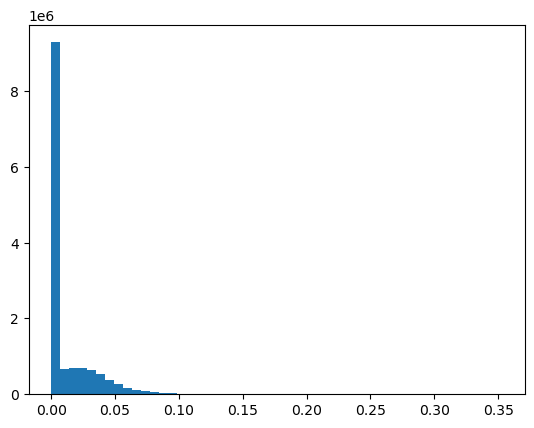

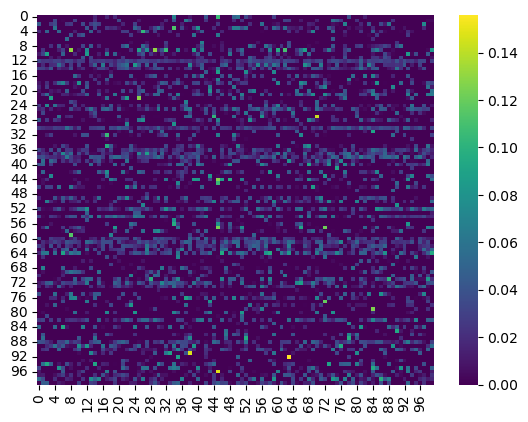

In [154]:
plt.hist(encodings.flatten(), bins=50)
plt.show()
sns.heatmap(encodings[:100, :100], cmap='viridis')
plt.show()

The first plot shows the average value of activation. One can see that most of the neurons have exactly 0. Moreoveor, the heatmap below shows the activation of the first 100 neurons for the first 100 movies. Each row is a movie, and each column is a neuron number. One can see that only some specific neuron fire, which indicates that the model performed well. 

In [158]:
countries_of_interest = ['United States of America', 'Japan', 'France', 'Switzerland'] # We want to see the embeddings of the most famous movies

recent_mask = df['year'] >= 2000
somewhat_old_mask = (df['year'] >= 2000) & (df['year'] < 1960)
old_mask = df['year'] < 1960

mask = np.zeros((df.shape[0],1))

n = 30

# Filter for movies that have EXACTLY one of these countries
indices = []
countries = []
for country in countries_of_interest:
    country_movies = df[df[f'countries'] == country]
    
    m = len(indices)
    indices.extend(
        country_movies[recent_mask].nlargest(n, 'box_office_normalized').index.tolist()) # we get the recent countries for each country.
    countries.extend((len(indices) - m) * [country])
    if country == 'Switzerland' or country == 'Japan':
        continue
    m = len(indices)

    indices.extend(
        country_movies[somewhat_old_mask].nlargest(n, 'box_office_normalized').index.tolist()) # the less recent
    countries.extend(n * [country])

    indices.extend(
        country_movies[old_mask].nlargest(n, 'box_office_normalized').index.tolist()) # the old
    countries.extend(n * [country])

    countries.extend((len(indices) - m) * [country])

indices = np.array(indices)
countries = np.array(countries)

C:\Users\Corentin\AppData\Local\Temp\ipykernel_31348\186741159.py:19: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\Corentin\AppData\Local\Temp\ipykernel_31348\186741159.py:26: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\Corentin\AppData\Local\Temp\ipykernel_31348\186741159.py:30: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\Corentin\AppData\Local\Temp\ipykernel_31348\186741159.py:19: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\Corentin\AppData\Local\Temp\ipykernel_31348\186741159.py:19: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\Corentin\AppData\Local\Temp\ipykernel_31348\186741159.py:26: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\Corentin\AppData\Local\Temp\ipykernel_31348\186741159.py:30: UserWarning:

Boolean Series key will be r

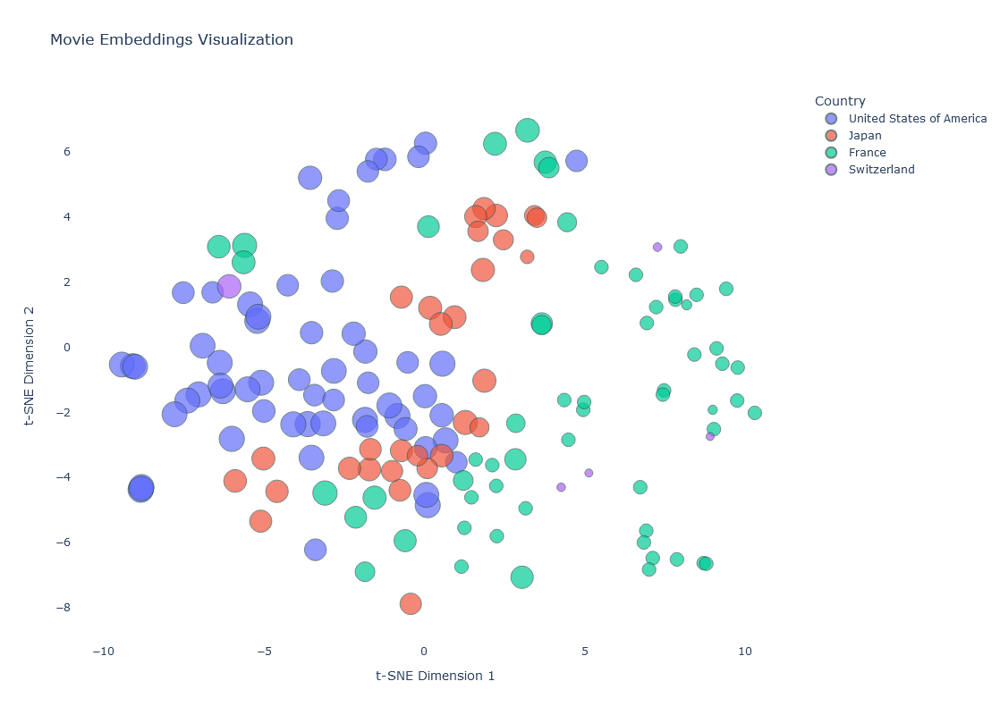

In [163]:
from sklearn.manifold import TSNE

def get_genre(s):
    # Returns the first genre that the movie has. If many of them are in the list, the first is chosen only, so be careful.
    keywords = ['Family', 'Thriller', 'Action', 'Short Film', 'Black-and-white', 'Comedy', 'Romance Film', 'Drama']
    for word in keywords:
        if word in s:
            return word
            
movies_interest = encodings[df_final_dataset.iloc[indices].index]

tsne = TSNE() # Clustering algorithm

reduce = tsne.fit_transform(movies_interest)

plot_df = pd.DataFrame({
    'TSNE_1': reduce[:, 0],
    'TSNE_2': reduce[:, 1],
    'Country': df_final_dataset.iloc[indices]['countries'].apply(lambda x: '' if x == np.nan else (x.split(',')[-1].strip())),
    'Year': df_final_dataset.iloc[indices]['year'],
    'Title': df_final_dataset.iloc[indices]['title'],
    'Box Office': X.iloc[indices]['box_office_normalized'],
    'Genres' : df_final_dataset.iloc[indices]['genres_cmu'].apply(lambda x: get_genre(str(x))) # Since movies have mutliple genres, we only take t
})
    
min_year = plot_df['Box Office'].min()
max_year = plot_df['Box Office'].max()
plot_df['marker_size'] = ((plot_df['Box Office'] - min_year) / (max_year - min_year) * 45 + 5) # The size is proportional to the age of the movie
    
fig = px.scatter(
    plot_df,
    x='TSNE_1',
    y='TSNE_2',
    color='Country', # You can choose between "Genres" and "Country"
    size='marker_size',
    hover_data=['Title', 'Year'],
    title='Movie Embeddings Visualization',
    labels={
        'TSNE_1': 't-SNE Dimension 1',
        'TSNE_2': 't-SNE Dimension 2'
    }
)

fig.update_layout(
    plot_bgcolor='white',
    width=1000,
    height=800,
    legend_title_text='Country',
    showlegend=True,
    hovermode='closest'
)
    
fig.update_traces(
    marker=dict(
        line=dict(width=1, color='DarkSlateGrey')
    ),
    selector=dict(mode='markers')
)


As one can see, the movies of same countries are close. This emphasizes that the country is a decisive feature for a movie.

The Genres filtering produces a less clear result. The reason for that is probably that one cannot associate only one genre to a movie, since they can have many different genres. As a result, the countries might have a genre in common but the plot above will give them different colors. Another approach could be to color the dots in two colors, wether they have a single genre or not. 

In [164]:
# Convert the DataFrame to a JSON format, for the website again !
plot_data = plot_df.to_dict('records')

import json
with open('movie_data.json', 'w') as f:
    json.dump(plot_data, f)

## 4. Collaborative Filtering
<a id='section-4'></a>

### 4.A Loading the ratings data 
<a id='section-4.1'></a>

Until now we didn't need ratings but for collaborative filtering it is essential, so let us first load the ratings from Movielens. We start by merging the _df_links_ with the _df_ratings_ dataframe as the first one contains the mapping between the movieId of _df_ratings_ and the imdbId that we have in _df_final_dataset_.  

In [115]:
df_final_dataset = pd.read_pickle('Data/df_final_dataset.pickle')

In [123]:
# Load the ratings and the final dataset to take a subset of movies
df_ratings = pd.read_csv('Data/TMdB/ratings.csv')
df_links = pd.read_csv('Data/TMdB/links.csv') # Needed to make the link between Movielens ids and IMdB ids
df_ratings.shape

(26024289, 4)

In [118]:
# To have the same ids as the final dataset
df_links['imdbId'] = df_links['imdbId'].apply(format_imdb_id)

In [119]:
df_ratings_with_imdb_id = pd.merge(df_ratings, df_links, on='movieId', how='left')

In [120]:
df_ratings_with_imdb_id = df_ratings_with_imdb_id[df_ratings_with_imdb_id['imdbId'].isin(df_final_dataset['imdb_id'].unique())]

In [121]:
df_ratings_with_imdb_id.head()

,userId,movieId,rating,timestamp,imdbId,tmdbId
0,1,110,1.0,1425941529,tt0112573,197.0
1,1,147,4.5,1425942435,tt0112461,10474.0
2,1,858,5.0,1425941523,tt0068646,238.0
3,1,1221,5.0,1425941546,tt0071562,240.0
4,1,1246,5.0,1425941556,tt0097165,207.0


In [122]:
df_ratings_with_imdb_id['imdbId'] = df_ratings_with_imdb_id['imdbId'].apply(unformat_imdb_id)

We have decided that both users and movies with less than 5 ratings needed to be removed from our dataset. This is because if we compute the predicted rating with too few users or movies the prediction can be very bad. 

In [124]:
df_ratings = filter_ratings_dataframe(df_ratings_with_imdb_id, 5)
df_ratings.shape

Number of valid users: 255062
Number of valid movies: 19485


(25039215, 6)

Then we need to create a sparse matrix. For that we need the user Ids and the movies Ids to go from 0 to the respective number of users and movies. We thus need to create a mapping between the ids that will be passed to the sparse matrix and the current ids that we have in 'userId' and 'imdbId'. This is what is done below.

In [125]:
user_map, reverse_user_map = create_mapping(df_ratings['userId'])
movie_map, reverse_movie_map = create_mapping(df_ratings['imdbId'])


Creating ID mappings...
Mapping created in 0.27 seconds
Total unique elements: 255062

Creating ID mappings...
Mapping created in 1.93 seconds
Total unique elements: 19485


In [126]:
df_ratings['sparse_user_id'] = df_ratings['userId'].map(user_map)
df_ratings['sparse_movie_id'] = df_ratings['imdbId'].map(movie_map)
df_ratings.head(2)

,userId,movieId,rating,timestamp,imdbId,tmdbId,sparse_user_id,sparse_movie_id
0,1,110,1.0,1425941529,112573,197.0,0,0
1,1,147,4.5,1425942435,112461,10474.0,0,1


We can then drop all the columns that we don't need.

In [127]:
df_ratings.drop(columns=['timestamp', 'userId', 'movieId', 'tmdbId', 'imdbId'], inplace=True)
df_ratings.head(2)

,rating,sparse_user_id,sparse_movie_id
0,1.0,0,0
1,4.5,0,1


In [128]:
n_items = 19485
n_users = 255062
ratings_matrix = create_sparse_ratings_matrix(df_ratings, n_users, n_items)

Global mean rating: 3.53


### 4.B Visualization
<a id='section-4.2'></a>

In [129]:
fig = plot_hist_ratings(df_ratings_with_imdb_id)

fig.write_image("Visualization/hist_ratings.png", width=1100, height=600, scale=10)
fig.write_html("Visualization/hist_ratings.html")

In [130]:
Image("Visualization/hist_ratings.png")

In [131]:
fig = plot_most_rated_movies(df_ratings_with_imdb_id, df_final_dataset)

fig.write_image("Visualization/most_rated.png", width=1100, height=600, scale=10)
fig.write_html("Visualization/most_rated.html")

In [132]:
Image("Visualization/most_rated.png")

In [133]:
fig = plot_most_ratings_users(df_ratings_with_imdb_id)

fig.write_image("Visualization/most_ratings_users.png", width=1100, height=600, scale=10)
fig.write_html("Visualization/most_ratings_users.html")

In [134]:
Image("Visualization/most_ratings_users.png")

In [135]:
fig = plot_average_vs_number_of_ratings(df_ratings_with_imdb_id)

fig.write_image("Visualization/average_vs_number_of_ratings.png", width=1100, height=600, scale=10)
fig.write_html("Visualization/average_vs_number_of_ratings.html")

In [136]:
Image("Visualization/average_vs_number_of_ratings.png")

### 4.C Neighborhood-Based Methods
<a id='section-4.3'></a>

We start by splitting the ratings into a train and test sets.

In [109]:
start = time.time()
train, test = split_into_train_and_test(df_ratings)
print(time.time()-start)


--- Performing Train-Test Split ---
Total ratings: 25039215
Training set size: 19934673 (79.61%)
Test set size: 5104542 (20.39%)
269.44527101516724


In [110]:
ratings_matrix_train = create_sparse_ratings_matrix(train, n_users, n_items)

Global mean rating: 3.53


In [111]:
ratings_matrix_test = create_sparse_ratings_matrix(test, n_users, n_items)

Global mean rating: 3.53


#### 4.C.a User-Based 
<a id='section-4.3.1'></a>

_Model selection_

To do the model selection we compute the RMSE on a subset of users from the test set. Indeed, it was way too much expensive to compute it over all ratings in the test set such that we were forced to estimate it over a smaller number of users. 

In [165]:
means_by_user = df_ratings.groupby('sparse_user_id')['rating'].mean()
std_by_user = df_ratings.groupby('sparse_user_id')['rating'].std()

In [166]:
knn_user_train = NearestNeighbors(metric='cosine', algorithm='brute', n_jobs=-1, n_neighbors=20)
knn_user_train.fit(ratings_matrix_train)

NearestNeighbors(algorithm='brute', metric='cosine', n_jobs=-1, n_neighbors=20)

In [167]:
start = time.time()
weights_dict_user, indices_dict_user, selected_users_user = compute_user_weights_and_indices(
    test,  
    ratings_matrix_test, 
    knn_user_train,  
    n_users=300
)
print(time.time()-start)

Weights and indices for half of the users computed...
125.32104659080505


In [168]:
start = time.time()
results_user = reco_user_based_test_set(test, df_ratings, weights_dict_user, indices_dict_user, selected_users_user, k=30)
print(time.time()-start)

sparse_movie_id
0        [0, 31, 53, 75, 83, 120, 131, 134, 142, 197, 2...
1        [65, 141, 156, 741, 780, 945, 947, 1336, 1667,...
2        [31, 45, 51, 60, 113, 124, 150, 162, 235, 255,...
3        [10, 58, 113, 153, 162, 193, 239, 253, 278, 28...
4        [63, 99, 108, 162, 496, 537, 781, 804, 869, 10...
                               ...                        
19478                                     [158399, 236492]
19479                                             [158868]
19480                                     [167918, 229255]
19482                                     [182800, 229200]
19483                                             [249227]
Name: sparse_user_id, Length: 18617, dtype: object
sparse_movie_id
0        [16868, 17469, 20804, 32353, 39523, 81416, 119...
1                                   [5933, 138135, 160511]
2        [52502, 94741, 113068, 136198, 148853, 151290,...
3        [56450, 56940, 64475, 75134, 81015, 130173, 15...
4             [17469, 27556, 737

Basic Method:
Mean Absolute Error (MAE): 0.8651
Root Mean Square Error (RMSE): 1.1271

Mean Centering Method:
Mean Absolute Error (MAE): 0.7813
Root Mean Square Error (RMSE): 1.0222

Z Normalization Method:
Mean Absolute Error (MAE): 0.7764
Root Mean Square Error (RMSE): 1.0315



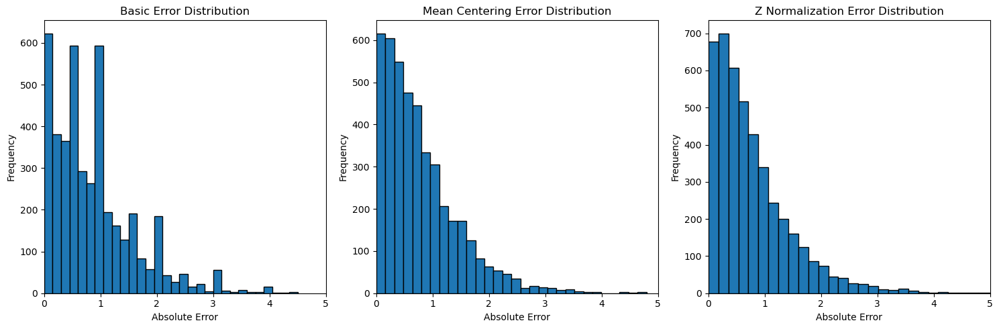

In [141]:
# Usage
selected_users_df_user = test[test['sparse_user_id'].isin(selected_users_user)]
selected_users_df_with_predictions_user = add_predicted_ratings_for_users(results_user, selected_users_df_user)

# Compute evaluation metrics for each method
for method in ['basic', 'mean_centering', 'z_normalization']:
    mae = selected_users_df_with_predictions_user[f'rating_error_{method}'].mean()
    rmse = np.sqrt(selected_users_df_with_predictions_user[f'rating_error_squared_{method}'].mean())
    
    print(f"{method.replace('_', ' ').title()} Method:")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"Root Mean Square Error (RMSE): {rmse:.4f}")
    print()

plot_predicted_ratings_distribution(selected_users_df_with_predictions_user)

_Handling new user_

We now also define functions such that a list of ratings for some movies from a new user can be passed and the recommendations computed. This is necessary such that the model can be put as a demo in the data story.

In [142]:
knn_user = NearestNeighbors(metric='cosine', algorithm='brute', n_jobs=-1, n_neighbors=20)
knn_user.fit(ratings_matrix)

NearestNeighbors(algorithm='brute', metric='cosine', n_jobs=-1, n_neighbors=20)

In [ ]:
ratings_new_user = [('112573', 3.5), ('97165', 2), ('468569', 5), ('1010048', 4.5), ('814335', 4.5), ('209144', 3.5), ('796366', 2.5), 
               ('119094', 4)]

In [ ]:
recommendations = reco_user_based_new_user(ratings_new_user, movie_map, df_ratings, knn_user, means_by_user, std_by_user, ratings_matrix.shape[1],
                             num_reco=20, number_of_neighbors=200000, max_number_of_movies=20000, number_of_users=50)

In [ ]:
for ratings__ in ratings_new_user:
    print(df_final_dataset[df_final_dataset['imdb_id'] == str(format_imdb_id(int(ratings__[0])))]['title'].values, ratings__[1])
    

In [ ]:
for rec in recommandations['mean_centering'][:10]:
    print(df_final_dataset[df_final_dataset['imdb_id'] == str(format_imdb_id(reverse_movie_map[rec[0]]))]['title'].values, rec[1])

#### 4.C.b Item-Based 
<a id='section-4.3.2'></a>

Model selection

In [169]:
means_by_movie = df_ratings.groupby('sparse_movie_id')['rating'].mean()
std_by_movie = df_ratings.groupby('sparse_movie_id')['rating'].std()

In [170]:
knn_movie_train = NearestNeighbors(metric='cosine', algorithm='brute', n_jobs=-1, n_neighbors=20)
knn_movie_train.fit(ratings_matrix_train.T)

NearestNeighbors(algorithm='brute', metric='cosine', n_jobs=-1, n_neighbors=20)

In [171]:
start = time.time()
weights_dict_movie, indices_dict_movie, selected_movies = compute_movie_weights_and_indices(
    test,  
    ratings_matrix_test, 
    knn_movie_train,  
    n_movies=200
)
print(time.time()-start)

111.80100560188293


In [172]:
start = time.time()
results_movie = reco_item_based_test_set(test, train, weights_dict_movie, indices_dict_movie, selected_movies, max_number_of_users=500, k=30)
print(time.time()-start)

movie 0/200
21
movie 1/200
11
movie 2/200
24
movie 3/200
31
movie 4/200
136
movie 5/200
4
movie 6/200
2
movie 7/200
326
movie 8/200
33
movie 9/200
1
movie 10/200
11
movie 11/200
18
movie 12/200
1
movie 13/200
3
movie 14/200
29
movie 15/200
9
movie 16/200
465
movie 17/200
5
movie 18/200
168
movie 19/200
103
movie 20/200
6715
movie 21/200
91
movie 22/200
61
movie 23/200
60
movie 24/200
2
movie 25/200
31
movie 26/200
167
movie 27/200
53
movie 28/200
6
movie 29/200
1
movie 30/200
4
movie 31/200
784
movie 32/200
47
movie 33/200
16
movie 34/200
125
movie 35/200
131
movie 36/200
563
movie 37/200
1
movie 38/200
1
movie 39/200
3
movie 40/200
959
movie 41/200
1
movie 42/200
2333
movie 43/200
21
movie 44/200
32
movie 45/200
5
movie 46/200
1
movie 47/200
291
movie 48/200
3
movie 49/200
136
movie 50/200
9
movie 51/200
4
movie 52/200
466
movie 53/200
5
movie 54/200
4052
movie 55/200
3
movie 56/200
4
movie 57/200
2051
movie 58/200
344
movie 59/200
358
movie 60/200
5
movie 61/200
66
movie 62/200
1
mov

Basic Method:
Mean Absolute Error (MAE): 0.7238
Root Mean Square Error (RMSE): 0.9593

Mean Centering Method:
Mean Absolute Error (MAE): 0.6616
Root Mean Square Error (RMSE): 0.8671

Z Normalization Method:
Mean Absolute Error (MAE): 0.6613
Root Mean Square Error (RMSE): 0.8694



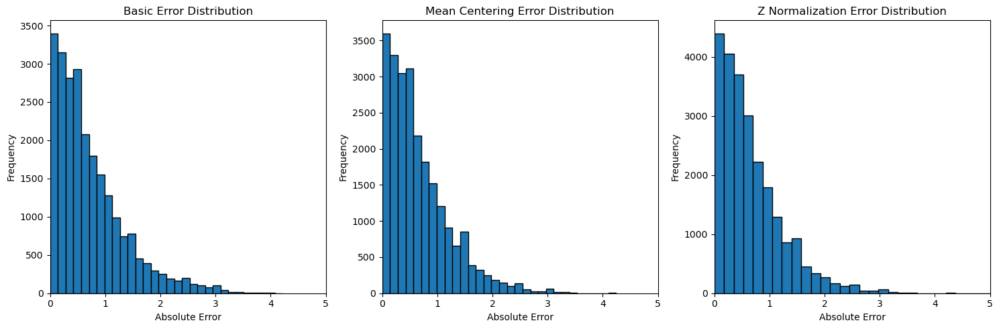

In [173]:
# Usage
selected_movies_df = test[test['sparse_movie_id'].isin(selected_movies)]
selected_movies_df_with_predictions = add_predicted_ratings_for_movies(results_movie, selected_movies_df)

# Compute evaluation metrics for each method
for method in ['basic', 'mean_centering', 'z_normalization']:
    mae = selected_movies_df_with_predictions[f'rating_error_{method}'].mean()
    rmse = np.sqrt(selected_movies_df_with_predictions[f'rating_error_squared_{method}'].mean())
    
    print(f"{method.replace('_', ' ').title()} Method:")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"Root Mean Square Error (RMSE): {rmse:.4f}")
    print()

plot_predicted_ratings_distribution(selected_movies_df_with_predictions)

In [ ]:
selected_movies_df_with_predictions.head(5)

Handling new user

In [ ]:
knn_movie = NearestNeighbors(metric='cosine', algorithm='brute', n_jobs=-1, n_neighbors=20)
knn_movie.fit(ratings_matrix.T)

In [ ]:
ratings_new_user = [('112573', 3.5), ('97165', 2), ('468569', 5), ('1010048', 4.5), ('814335', 4.5), ('209144', 3.5), ('796366', 2.5), 
               ('119094', 4)]

In [ ]:
sorted_basic, sorted_mean, sorted_z = reco_item_based_new_user(ratings_new_user, movie_map, knn_movie, means_by_movie, std_by_movie,
                             ratings_matrix, number_of_reco=30, number_of_movies_for_reco=50)

In [ ]:
for rec in sorted_mean[:10]:
    print(df_final_dataset[df_final_dataset['imdb_id'] == str(format_imdb_id(reverse_movie_map[rec[0]]))]['title'].values, rec[1])

In [ ]:
for rec in sorted_z[:10]:
    print(df_final_dataset[df_final_dataset['imdb_id'] == str(format_imdb_id(reverse_movie_map[rec[0]]))]['title'].values, rec[1])

In [ ]:
for ratings__ in ratings_new_user:
    print(df_final_dataset[df_final_dataset['imdb_id'] == str(format_imdb_id(int(ratings__[0])))]['title'].values, ratings__[1])

### 4.D Dimensionality Reduction Methods - SVD
<a id='section-4.4'></a>

Model selection

In [ ]:
run_svd_recommender_example(ratings_matrix_train, ratings_matrix_test, train, df_ratings, new_model=True,
                                n_factors=1000, learning_rate=0.01, regularization=0.02, n_epochs=1, 
                                filename='Weights/SVD_weights.joblib')

Handling new user 

In [ ]:
new_ratings = [('112573', 3.5), ('97165', 2), ('468569', 5), ('1010048', 4.5), ('814335', 4.5), ('209144', 3.5), ('796366', 2.5), 
               ('119094', 4)]

In [ ]:
new_ratings_df = pd.DataFrame(new_ratings, columns=['original_movie_id', 'rating'])
new_ratings_df['sparse_movie_id'] = new_ratings_df['original_movie_id'].map(movie_map)
ratings_to_pass_df = new_ratings_df.drop(columns=['original_movie_id'])
ratings_to_pass_df.dropna(inplace=True)
ratings_to_pass_df

In [ ]:
recommender = SparseSVDRecommender()

In [ ]:
recommender.load_model('Weights/sample_svd_model14.joblib')

In [ ]:
recommendations = recommender.handle_new_user(ratings_to_pass_df, n_items=5)


In [ ]:
for _, row in ratings_to_pass_df.iterrows():
    imdbid = format_imdb_id(reverse_movie_map[row['sparse_movie_id']])
    name = df_final_dataset[df_final_dataset['imdb_id'] == imdbid]['title'].values
    if name.size > 0:  # Check if a title is found
        name = name[0]  # Extract the first title
    else:
        name = "Unknown"  # Handle missing titles
    print(f"Movie name: {name}, Rating: {row['rating']}")

In [ ]:
for movie_id, score in recommendations[:20]:
    imdbid = format_imdb_id(reverse_movie_map[movie_id])
    name = df_final_dataset[df_final_dataset['imdb_id'] == imdbid]['title'].values
    print(f"Movie name: {name}, Predicted Rating: {score:.2f}")

### 4.E Comparing collaborative filtering models
<a id='section-4.5'></a>

For the three models of collaborative filtering discussed above we have obtained the following MAE and RMSE values for the best model respectively. As we can clearly see, the SVD model is indeed superior to both neighborhood-based methods. However, item-based method seems to performed also way better than the user-based method. While we have played a bit with th parameters, it is clear that some better models could have been found by further optimisation of the parameters.

| Algorithm         | MAE   | RMSE  | Parameters                                |
|--------------------|-------|-------|------------------------------------------|
| KNN User-Based    | 0.7813 | 1.022 | n_neighbors: 30, metric: cosine     |
| KNN Item-Based    | 0.6616 | 0.8671 | n_neighbors: 30, metric: cosine      |
| SVD               | 0.6319 | 0.8278 | n_factors=20, learning_rate=0.01, regularization=0.02, n_epochs=5   |
